# Trolley problem - Data Science project
#### Samuel Martins e Andrea Chinetti

## Modifiche rispetto alla presentazione
* aggiunto [tabelle di contingenza](#Contingency_tables_2)
* modificato grafico [__Outcome by education__](#education)
* aggiunto grafico [__Outcome by gender__](#gender)
* aggiunto grafico [__Outcome by political activity__](#politic)
* aggiunto grafico [__Outcome by age__](#age)

## Trolley problem
Alle persone che hanno deciso di partecipare al sondaggio è stata fatta la stessa domanda: "cosa faresti in ognuna delle seguenti situazioni"<br>
Ogni persona si è trovata davanti a 3 situazioni:<br>
Switch : se si dovesse decidere di intervenire si andrebbe a uccidere una persona salvandone 5. Nel caso in cui non si dovesse intervenire 5 persone morirebbero.<br>
Loop: caso molto simile al precedente fatta eccezione per una differenza ed è il fatto che nel caso in cui si dovesse tirare la leva la morte della persona è strettamente necessaria per poter fermare il treno e salvare le altre persone. Anche in questo caso se non si dovesse intervenire 5 persone morirebbero.<br>
Footbride: caso completamente diverso dagli altri 2. Infatti qua ci troviamo sopra un ponte e dobbiamo decidere se spingere giu la persona oppure no. Nel caso in cui si dovesse decidere di spingere giu la persona salverebbe la vita agli altri fermando il treno.

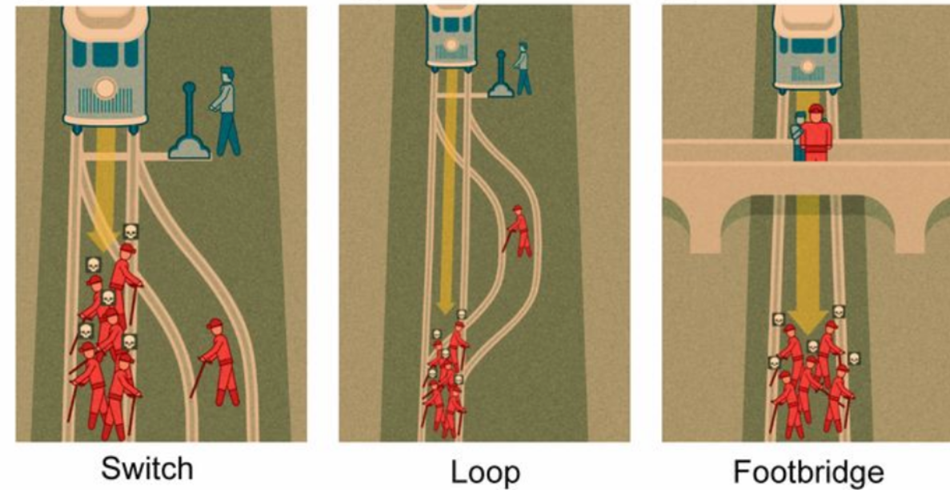

# Il dataset
I dati presenti nel dataset provengono da Moral Machine un sito creato dal MIT dove chiunque può provare a fare questi o altri test. Al termine di questo test alle persone è stato proposto di compilare un sondaggio per poter ottenere dei dati demografici, politici e religiosi.
[dataset](https://bit.ly/2Y7Brr9)

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import country_converter as coco
import seaborn as sns
from  matplotlib.ticker import PercentFormatter
import requests

df = pd.read_csv("data/Shared_data_responses_demographics.csv")
df

,UserIP_Anonymized,Scenario,survey.age,survey.gender,survey.education,survey.political,survey.religious,country_code,Outcome,Continent
0,0002ae2d,Footbridge,19,Women,College,0.56,0.00,GB,0,Europe
1,0002ae2d,Loop,19,Women,College,0.56,0.00,GB,1,Europe
2,0002ae2d,Switch,19,Women,College,0.56,0.00,GB,1,Europe
3,00065336,Footbridge,19,Men,College,0.00,0.68,FR,1,Europe
4,00065336,Loop,19,Men,College,0.00,0.68,FR,0,Europe
...,...,...,...,...,...,...,...,...,...,...
59154,ffef6123,Footbridge,27,Men,College,0.34,0.53,SG,0,Asia
59155,ffef6123,Loop,23,Men,College,1.00,0.00,SG,1,Asia
59156,ffef6123,Loop,27,Men,College,0.34,0.53,SG,1,Asia
59157,ffef6123,Switch,23,Men,College,1.00,0.00,SG,1,Asia


Con questa tabella di contingenza abbiamo voluto mostrare quante persone divise per sesso e per continente hanno partecipato al sondaggio

<a id='Contingency_tables_2'></a>

In [2]:
df.groupby(["Continent","survey.gender"]).size().unstack()

survey.gender,Men,Women
Continent,,
Americas,12348,4892
Asia,5160,1559
Europe,25641,8163
Oc.,1017,379


 Con quest'altra tabella di contingenza invece abbiamo deciso di vedere quante persone hanno frequentato il college divise per sesso

In [3]:
df.groupby(["survey.gender","survey.education"]).size().unstack()

survey.education,College,No College
survey.gender,,
Men,32345,11821
Women,10747,4246


# Religiosità e attività politica

### Come sono stati calcolati questi valori?
Le persone che hanno partecipato a questo studio hanno risposto a delle domande e in base a come rispondevano hanno ottenuto un punteggio. Non sappiamo quali sono state le domande ne se questo valore di religiosità prende in considerazione qualsiasi religione o solo quelle occidentali.<br>
Nel seguente grafico possiamo vedere quante persone rientrano in quale range di religiosità.

In [5]:
sorted_religiuos = df.sort_values(by='survey.religious')
sorted_religiuos["believer"] = "0" # non credente
sorted_religiuos.loc[(df["survey.religious"] > 0) & (sorted_religiuos["survey.religious"] < 0.4) , "believer"] = "(0; 0.4)" #poco credente
sorted_religiuos.loc[(df["survey.religious"] >= 0.4) & (sorted_religiuos["survey.religious"] < 0.7), "believer"] = "[0.4; 0.7)" #credente
sorted_religiuos.loc[df["survey.religious"] >= 0.7, "believer"] = "[0.7; 1)" # molto credente
px.histogram(sorted_religiuos, x="believer",
            labels={"believer": "Believer"})

In [24]:
sorted_political = df.sort_values(by='survey.political') 
sorted_political["Political Activity"] = "0" # non attivo
sorted_political.loc[(df["survey.political"] > 0) & (sorted_political["survey.political"] < 0.4) , "Political Activity"] = "(0; 0.4)" #poco attivo
sorted_political.loc[(df["survey.political"] >= 0.4) & (sorted_political["survey.political"] < 0.7), "Political Activity"] = "[0.4; 0.7)" #attivo
sorted_political.loc[df["survey.political"] >= 0.7, "Political Activity"] = "[0.7; 1)" #molto attivo
px.histogram(sorted_political, x="Political Activity")

## Religiosità
Inizialmente ci siamo chiesti se le persone religiose intervengono in modo diverso rispetto alle persone non religiose in questo tipo di situazioni. Prima di rispondere è utile però spiegare brevemente come i dati relativi alla religiosità sono stati raccolti.
### Categorizzazione religiosità
Abbiamo deciso di suddividere le persone nel seguente modo:
* religiosità uguale a 0: persona non religiosa
* religiostà maggiore di 0: persona religiosa

### La religiosità influenza la scelta?
Possiamo quindi vedere dal grafico sottostante come non ci sia nessuna differenza fra le persone religiose e quelle non religiose.

In [6]:
df["outcome_str"] = df["Outcome"].map({0 : "Omission", 1: "Commission"})
df["outcome_str"]
df.loc[df["survey.religious"] == 0.0, "religion"] = 'Religious'
df.loc[df["survey.religious"] != 0.0, "religion"] = 'Not religious'

fig = px.histogram(df, 
                   orientation="v", 
                   x="religion", 
                   barmode="group",
                   barnorm='percent',
                   color="outcome_str",
                   facet_col="Scenario",
                   title="Outcome by religiosity",
                   labels={"outcome_str": "Outcome"},
                   category_orders={"outcome_str": ["Commission","Omission"],
                                   "religion": ["Religious","Not religious"]},
                   color_discrete_sequence=['indianred', '#1f77b4'])

fig.update_yaxes(title_text='')
fig.update_xaxes(title_text='')
fig.update_yaxes(ticksuffix='%')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig

<a id='politic'></a>
## Attività politica

### Categorizzazione attivita politica


### La  influenza la scelta?


 Come fatto precedentemente abbiamo scelto di vedere la differenza tra una persona attiva politicamente e una no. Come fatto precedentemente abbiamo deciso di considerare una persona attiva politicamente se ha un valore al di sopra dello 0 e una non attiva per il valore uguale a 0. Con i dati a nostra disposizione possiamo solo sapere se la persona è attivo/interessato all'attività politica, ma non sappiamo quale sia la posizione politica della persona. Come possiamo notare nello scenario del Footbride una persona attiva politicamente è più propensa a intervenire rispetto a una non attiva. Questa differenza scompare nei altri due casi infatti come vediamo la scelta è praticamente uguale.

In [18]:
df.loc[df["survey.political"] <= 0.5, "activity"] = 'Active'
df.loc[df["survey.political"] > 0.5, "activity"] = 'Not Active'

fig = px.histogram(df, 
                   orientation="v", 
                   x="activity", 
                   barmode="group",
                   barnorm='percent',
                   color="outcome_str",
                   facet_col="Scenario",
                   title="Outcome by political activity",
                   labels={"outcome_str": "Outcome"},
                   category_orders={"outcome_str": ["Commission","Omission"],
                                   "political": ["Active","Not Active"]},
                   color_discrete_sequence=['indianred', '#1f77b4'])

fig.update_yaxes(title_text='')
fig.update_xaxes(title_text='')
fig.update_yaxes(ticksuffix='%')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig

<a id='gender'></a>
# Il sesso influenza la scelta?
Anche in questo caso, come per la religione, non c'è nessuna relazione fra sesso del utente e la sua scelta.

In [7]:
fig = px.histogram(df, 
                   orientation="v", 
                   x="survey.gender", 
                   barmode="group",
                   barnorm='percent',
                   color="outcome_str",
                   facet_col="Scenario",
                   title="Outcome by gender",
                   labels={"outcome_str": "Outcome"},
                   category_orders={"outcome_str": ["Commission","Omission"]},
                   color_discrete_sequence=['indianred', '#1f77b4'])

fig.update_yaxes(title_text='')
fig.update_xaxes(title_text='')
fig.update_yaxes(ticksuffix='%')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes()
fig

<a id='education'></a>
# L'educazione influenza la scelta?
In questo caso invece si può notare una differenza nello scenario del _Footbridge_. Si può vedere come la maggiorparte delle persone che hanno frequentato il college tendono a non intervenire mentre la maggiorparte delle persone che __non__ hanno frequentato il college tendono ha intervenire.

In [8]:
fig = px.histogram(df, 
                   orientation="v", 
                   x="survey.education", 
                   barmode="group",
                   barnorm='percent',
                   color="outcome_str",
                   facet_col="Scenario",
                   title="Outcome by education",
                   labels={"outcome_str": "Outcome"},
                   category_orders={"outcome_str": ["Commission","Omission"]},
                   color_discrete_sequence=['indianred', '#1f77b4'])

fig.update_yaxes(title_text='')
fig.update_xaxes(title_text='')
fig.update_yaxes(ticksuffix='%')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes()

fig

<a id='age'></a>
# L'età influenza la scelta?
In queso grafico abbiamo deciso di raggruppare tutte le persone in gruppi di età di 4 anni e osservare le diverse scelte fatte.
* In quanto avevamo pochi dati per i più anziani, i dati erano molto rumorosi. Abbiamo quindi deciso di raggruppare i dati in bins da 4 anni.
* C'è una dato interessante per gli anziani nello scenario del _Loop_. Si può notare che al contrario di come visto finora, dove _Switch_ e _Loop_ erano sempre molto simili, gli anziani tendono a votare in modo diverso nei due scenari, nello specifico tendono a non agire nello scenario _Loop_.

In [23]:
fig = px.histogram(df, 
                   orientation="v", 
                   x="survey.age", 
                   color="outcome_str", 
                   barmode="stack", 
                   barnorm='fraction',
                   facet_row="Scenario", 
                   title="Outcome by age",
                   nbins=20, 
                   labels={"outcome_str": "Outcome",
                          "survey.age": "Age"},
                  category_orders={"outcome_str": ["Commission","Omission"]},
                   color_discrete_sequence=['indianred', '#1f77b4'])

fig.update_yaxes(tickformat='%')
fig.update_yaxes(title_text='')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig

# Selta in base alla nazione
Abbiamo pensato che sarebbe stato interessante vedere se c'è qualche differenza fra le varie nazioni del mondo. Dal grafico sottostante si possono notare che:
* Le nazione asiatiche (es.: _Cina_, _Giappone_, _Tailandia_) hanno un colore tendente al blu, il che significa una percentuale di intervento molto più bassa rispetto al resto del mondo.
* Alcune nazione risultano avere il 100% o il 0% di intervento (es.: _Surimane_, _Oman_), queste nazioni hanno pochi dati e quindi molto probabilmente la media non è rappresentativa di quella nazione.


In [10]:
total_list = df.groupby("country_code")["Outcome"].mean().tolist()
count_list = df.groupby("country_code")["Outcome"].count().tolist()

country_list = df["country_code"].tolist()
country_set = set(country_list)
country_list = list(country_set)
country_list.sort()
country_list = coco.convert(names=country_list, to='name_short')

new_df = pd.DataFrame(list(zip(country_list, total_list, count_list)), 
               columns =['Country', 'percent', 'count'])


fig = go.Figure(data=go.Choropleth(
    locationmode = "country names",
    locations = new_df['Country'],
    z = new_df['percent'],
    autocolorscale=False,
    reversescale=False,
    colorbar_title = 'Percantage commision',
))

fig.update_layout(
    title_text='Percentage commision by country',
)
fig.update_traces(colorbar_tickformat='%')
fig

# Scelta per continente
Visto il risultato interessante ottenuto nel grafico precedente, dove i paesi asiatici avevano un grado di intervento più basso, abbiamo deciso di fare un grafico tenendo in considerazione i continenti invece delle singole nazioni. Si può notare quindi che:
* L'Asia ha effettivamente una percentuale di intervento più bassa (quasi del 10%) rispetto ai altri continenti.
* Lo scenario del _footbridge_ è quello con un grado di intervento più basso indipendentemente dai continenti.
* Lo scenario del _loop_ e dello _switch_ sono molto simili, il _loop_ ha un grado di intervento leggermente più basso.

[]

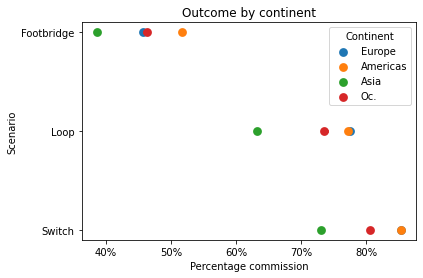

In [11]:
ax = sns.pointplot(x = 'Outcome',
                   y = 'Scenario',
                   hue="Continent",
                   ci =10,
                   data = df, 
                   join = False)

ax.set_title('Outcome by continent')
ax.set(xlabel='Percentage commission')
ax.xaxis.set_major_formatter(PercentFormatter(1))

ax.plot()

# Correlazione tra qualita della vita e scelta
Ho pensato ci potesse essere una differenza tra le scelte di abitanti di paesi ricchi e abitanti di paesi meno ricchi. Ho quindi pensato di fare uno scatter plot fra l'indice di qualità della vità e la percentuale di intervento, per cercare se ci fosse una correlazione. I dati utilizzati provengono dal sito [Quality of Life Index by Country](https://www.numbeo.com/quality-of-life/rankings_by_country.jsp)
* Il coefficente di correlazioni lineare è molto basso, questo ci fa pensare che non ci sia un collegamento fra i due dati.
* La dimensione dei cerchi dipende dal numero di osservazioni disponibili. Ho deciso di fare cosi perché certe nazioni avevano pochi dati e quindi una percentuale poco rappresentativa. Con questa rappresentazione i cerchi più grandi rappresentano dati più affidabili.

In [12]:
url = 'https://www.numbeo.com/quality-of-life/rankings_by_country.jsp'
crypto_url = requests.get(url)
crypto_data = pd.read_html(crypto_url.text)
quality=crypto_data[1]

result = pd.merge(new_df, quality, on='Country', how='left')
resultClean = result.drop(columns="Rank").dropna()

fig = px.scatter(resultClean, x="percent", y="Quality of Life Index", size="count", hover_name="Country", 
                 title="Relation between commission and quality of life index",
                labels={"percent": "Percentage commission"},
                range_y=(80,200),
                 range_x=(0.4,0.8))

fig.update_xaxes(tickformat='%')
fig.show()
print('Indice di correlazione lineare fra tutte le nazioni: {value:.2f}'
      .format(value=np.corrcoef(
          resultClean["Quality of Life Index"], 
          resultClean["percent"])[0,1]))
print('Indice di correlazione lineare fra le nazioni con più di 200 osservazioni: {value:.2f}'
      .format(value=np.corrcoef(
          resultClean.loc[resultClean["count"] > 200, "Quality of Life Index"], 
          resultClean.loc[resultClean["count"] > 200, "percent"])[0,1]))

Indice di correlazione lineare fra tutte le nazioni: 0.25
Indice di correlazione lineare fra le nazioni con più di 200 osservazioni: 0.28


# Correlazione tra _World Index of Moral Freedom_ e scelta
Visto che l'indice di qualità della vita non ci ha mostrato una correlazione evidente ho pensato che ci potesse essere un indice che più si avvicinava agli elementi che possono influenzare una scelta come quella presa in considerazione da questo studio. Ho quindi trovato il [World Index of Moral Freedom](https://en.wikipedia.org/wiki/World_Index_of_Moral_Freedom), questo indice prende in considerazione aspetti che riguardano la libertà delle persone. Facendo lo scatter plot si possono notare alcune cose interessanti:
* Il coefficente di correlazioni lineare è, in questo caso, molto più alto rispetto a prima, se togliamo dal calcolo nazioni che hanno poche osservazioni.
* La Cina sia in questo caso che nel precendete è completamente staccata dal resto delle nazioni e si trova in basso a sinistra.
* Si può dire che, secondo questo grafico, una persona che vive in una nazione con un alto grado di libertà tende a intervenire di più rispetto ad un abitante di una nazione meno libera.

In [13]:
url = 'https://en.wikipedia.org/wiki/World_Index_of_Moral_Freedom'
freedreq = requests.get(url)
freed = pd.read_html(freedreq.text)
freed=freed[4]
resultfreed = pd.merge(new_df, freed, on='Country', how='left')
resultfreed = resultfreed.dropna()
fig = px.scatter(resultfreed, x="percent", y="2020 score", size="count", hover_name="Country",
                title="Relation between Commission and World Index of Moral Freedom",
                labels={"percent": "Percentage commission",
                       "2020 score": "World Index of Moral Freedom"},
                range_y=(30,100),
                 range_x=(0.4,0.8)
                )
fig.update_xaxes(tickformat='%')
fig.show()

print('Indice di correlazione lineare fra tutte le nazioni: {value:.2f}'.format(value=np.corrcoef(resultfreed["2020 score"], resultfreed["percent"])[0,1]))
print('Indice di correlazione lineare fra le nazioni con più di 200 osservazioni: {value:.2f}'.format(value=np.corrcoef(resultfreed.loc[resultfreed["count"] > 200, "2020 score"], 
                  resultfreed.loc[resultfreed["count"] > 200, "percent"])[0,1]))

Indice di correlazione lineare fra tutte le nazioni: 0.24
Indice di correlazione lineare fra le nazioni con più di 200 osservazioni: 0.65
